[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/AI4EPS/DAS_Seismology_Workshop/blob/main/notebooks/lab2_phasenet_das/Notebooks/lab2a_phasenet_das_inference.ipynb)

# Lab 2a: PhaseNet-DAS Inference

In this lab, you will learn how to:
- Load DAS (Distributed Acoustic Sensing) data from the USGS Arcata array
- Apply PhaseNet for P/S phase picking on DAS data
- Apply PhaseNet-DAS+, a DAS-specific model with event detection
- Compare picking quality between a general seismic model and a DAS-specific model

**References:**
- Zhu, W. & Beroza, G. (2019). PhaseNet: a deep-neural-network-based seismic arrival-time picking method. *GJI*.
- Zhu, W. et al. (2023). Seismic arrival-time picking on distributed acoustic sensing data using semi-supervised learning. *Nature Communications*, 14, 8192.
- Zhu, W. et al. (2025). Towards end-to-end earthquake monitoring using a multitask deep learning model. [arXiv:2506.06939](https://arxiv.org/abs/2506.06939)
- McGuire, J.J. et al. (2025). The GorDAS DAS Experiment Above the Cascadia Locked Zone and Subducted Gorda Slab. *SRL*, 96(4), 2489-2503.

---

## Setup

In [ ]:
!pip install phasenet huggingface_hub -q

In [2]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import h5py
import torch
from huggingface_hub import hf_hub_download

import phasenet.models
from phasenet.utils.inference import predict_2d, detect_picks
from phasenet.utils.postprocess import (
    estimate_origins_from_ps_pairs,
    associate_picks,
)

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using device: {DEVICE}")

DS = 10  # downsample factor for plotting

def plot_das(ax, arr, nx, nt, dt_s, **kwargs):
    """Plot a downsampled DAS 2D array."""
    arr = np.asarray(arr)
    ax.imshow(arr[::DS, ::DS], aspect="auto", interpolation="bilinear",
              extent=[0, nt * dt_s, nx, 0], **kwargs)

def plot_picks(ax, df, dt_s):
    """Plot P and S picks."""
    for phase, color in [("P", "red"), ("S", "blue")]:
        sub = df[df["phase_type"] == phase]
        ax.scatter(sub["phase_index"] * dt_s, sub["channel_index"].astype(int),
                   s=0.5, c=color, alpha=0.3,
                   label=f"{phase} ({len(sub)})")

Using device: cuda


## 1. Load DAS Data

We use DAS data from the USGS Arcata array in Northern California (McGuire et al. 2025), deployed to monitor the 2022 M6.4 Ferndale aftershock sequence. The array records strain rate along a fiber-optic cable with ~2m channel spacing at 250 Hz sampling rate.

We chose this dataset because:
1. It is **independent** from any data used in previous PhaseNet/PhaseNet-DAS development — allowing unbiased evaluation
2. It is a **small, self-contained** dataset (~2,470 events) — ideal for demonstrating how semi-supervised learning can rapidly improve a model on a new DAS array

Each event file is an H5 file containing a 2D array of shape `(nx, nt)` — number of spatial channels by number of time samples.

In [3]:
HF_REPO = "AI4EPS/quakeflow_das"

# Download a strong event with clear P and S arrivals
EVENT_ID = "20230106T122215Z"
h5_path = hf_hub_download(
    HF_REPO, f"arcata/data/{EVENT_ID}.h5", repo_type="dataset",
    local_dir="data/quakeflow_das",
)

with h5py.File(h5_path, "r") as fp:
    data = fp["data"][:]
    attrs = dict(fp["data"].attrs)

dt_s = float(attrs.get("dt_s", 0.008))
begin_time = str(attrs.get("begin_time", ""))
nx, nt = data.shape

print(f"Event: {EVENT_ID}")
print(f"Shape: (nx={nx}, nt={nt})")
print(f"Sampling interval: {dt_s} s ({1/dt_s:.0f} Hz)")
print(f"Duration: {nt * dt_s:.1f} s")
print(f"Begin time: {begin_time}")

Event: 20230106T122215Z
Shape: (nx=7550, nt=52500)
Sampling interval: 0.008 s (125 Hz)
Duration: 420.0 s
Begin time: 2023-01-06T12:22:15.741400Z


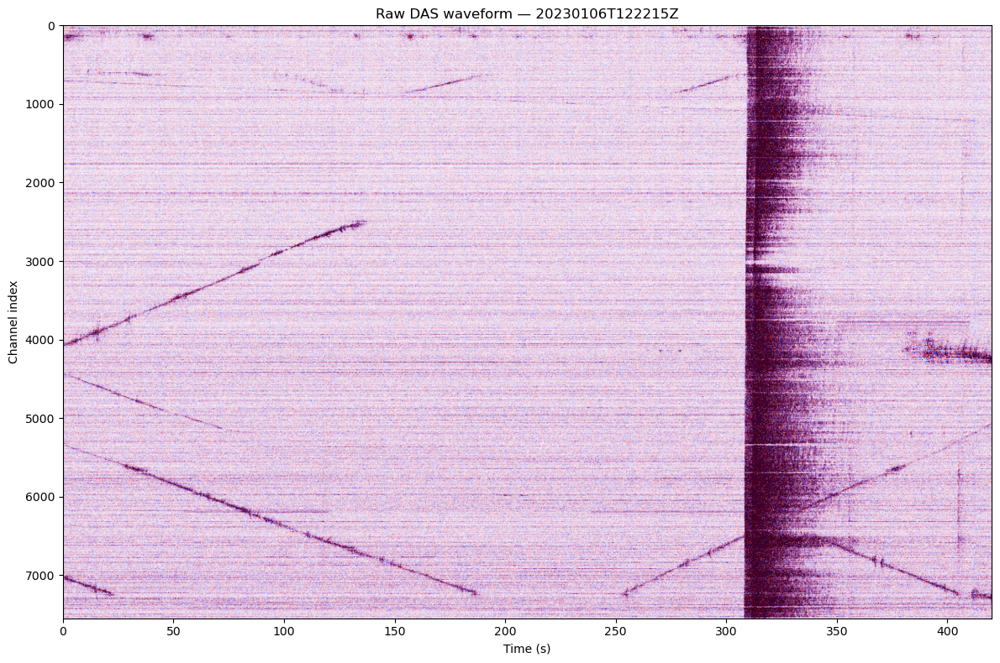

In [4]:
# Plot raw DAS waveform
fig, ax = plt.subplots(figsize=(12, 8))
vmax = 2 * np.percentile(np.abs(data), 95)
plot_das(ax, data, nx, nt, dt_s, cmap="seismic", vmin=-vmax, vmax=vmax)
ax.set_xlabel("Time (s)")
ax.set_ylabel("Channel index")
ax.set_title(f"Raw DAS waveform — {EVENT_ID}")
plt.tight_layout()
plt.show()

## 2. Run PhaseNet (Seismic Model)

PhaseNet (Zhu & Beroza, 2019) is a deep learning model originally designed for 3-component seismic data. It can be applied to single-component DAS data by treating the DAS channel as the vertical (Z) component and zero-padding the other two components.

PhaseNet processes each channel independently — it sees `(3, 1, nt)` per channel, treating each DAS channel as a single seismic station.

In [ ]:
# Prepare input: DAS → 3-component format (E=0, N=0, Z=data)
waveform_3ch = np.zeros((3, nx, nt), dtype=np.float32)
waveform_3ch[2] = data  # Z-component

print(f"Input shape: {waveform_3ch.shape}  (3 channels, {nx} stations, {nt} samples)")

In [6]:
# Load pretrained PhaseNet model
import urllib.request

MODELS_REPO = "AI4EPS/models"

def download_model(release, filename):
    """Download a model from GitHub releases (cached locally)."""
    cache_dir = os.path.expanduser(f"~/.cache/phasenet/{release}")
    local_path = os.path.join(cache_dir, filename)
    if not os.path.exists(local_path):
        os.makedirs(cache_dir, exist_ok=True)
        url = f"https://github.com/{MODELS_REPO}/releases/download/{release}/{filename}"
        print(f"Downloading {url}")
        urllib.request.urlretrieve(url, local_path)
    return local_path

# Load PhaseNet-2018
ckpt_path = download_model("PhaseNet-2018", "phasenet2018.pth")
ckpt = torch.load(ckpt_path, map_location="cpu", weights_only=False)
model_pn = phasenet.models.phasenet.build_model(
    backbone="unet2018", **ckpt.get("model_config", {})
)
model_pn.load_state_dict(ckpt["model"])
model_pn.to(DEVICE).eval()
print("PhaseNet-2018 loaded")

PhaseNet-2018 loaded


In [ ]:
# Run inference
# PhaseNet uses a sliding window of (256 channels, 3000 samples)
NX_PN, NT_PN = 256, 3000
MIN_PROB = 0.3

scores_pn = predict_2d(
    model_pn, waveform_3ch, NX_PN, NT_PN,
    min_t_overlap=0.1, device=DEVICE,
    taper_nx=False, taper_nt=True,  # Independent channels → no nx taper
)

print(f"Output scores shape: {scores_pn.shape}")  # (3, nx, nt) — Noise, P, S

In [8]:
# Detect picks from probability scores using peak detection
channel_ids = [str(i) for i in range(nx)]

picks_pn = detect_picks(
    scores_pn, channel_ids, EVENT_ID, begin_time,
    dt_s=dt_s, vmin=MIN_PROB, device=DEVICE,
)

df_pn = pd.DataFrame(picks_pn)
n_p = (df_pn["phase_type"] == "P").sum()
n_s = (df_pn["phase_type"] == "S").sum()
print(f"PhaseNet picks: {len(df_pn)} total ({n_p} P, {n_s} S)")

PhaseNet picks: 25314 total (13022 P, 12292 S)


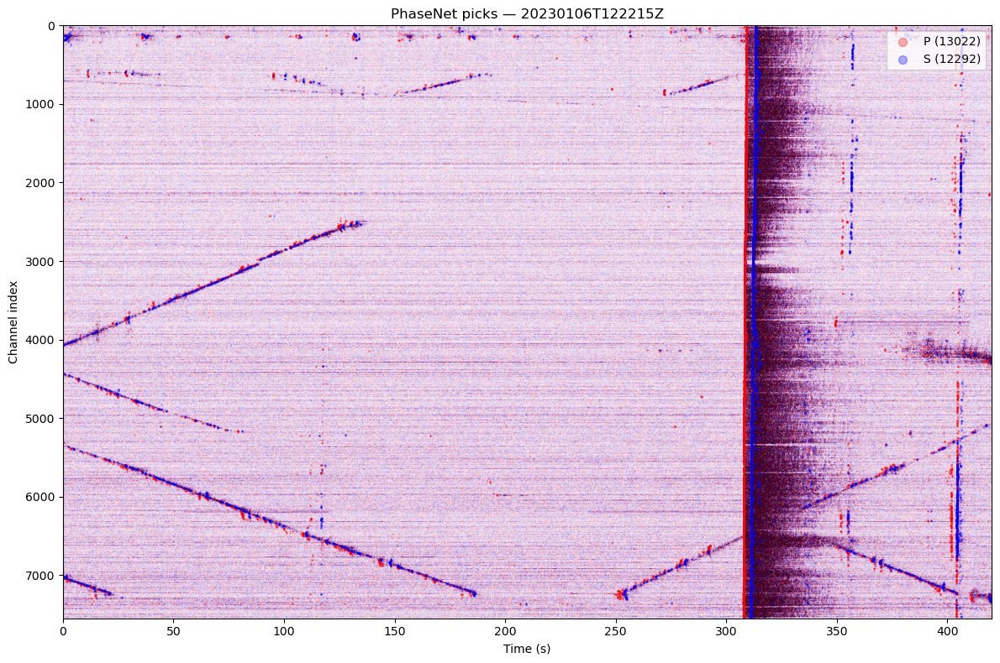

In [9]:
# Plot picks on waveform
fig, ax = plt.subplots(figsize=(12, 8))
plot_das(ax, data, nx, nt, dt_s, cmap="seismic", vmin=-vmax, vmax=vmax)
plot_picks(ax, df_pn, dt_s)
ax.set_xlabel("Time (s)")
ax.set_ylabel("Channel index")
ax.set_title(f"PhaseNet picks — {EVENT_ID}")
ax.legend(loc="upper right", markerscale=10)
plt.tight_layout()
plt.show()

## 3. Run PhaseNet-DAS+

PhaseNet-DAS+ (Zhu et al. 2023, 2025) is specifically designed for DAS data. Unlike PhaseNet which treats each channel independently, PhaseNet-DAS+ uses 2D convolutions across both spatial (channel) and temporal dimensions, learning the spatiotemporal patterns of seismic waves propagating along the fiber.

The model was trained using a semi-supervised approach: initial labels from PhaseNet picks were iteratively refined by retraining on associated picks.

Key differences from PhaseNet:
- **Input**: 1 channel (native DAS strain rate) instead of 3
- **Architecture**: 2D convolutions across (nx, nt) instead of independent 1D per channel
- **Output**: P/S scores + event detection head (PhaseNet+ multi-task framework)

In [ ]:
del model_pn, waveform_3ch
if torch.cuda.is_available():
    torch.cuda.empty_cache()

# Prepare input: native DAS format (1 channel)
waveform_1ch = data.astype(np.float32)[np.newaxis, :, :]  # (1, nx, nt)
print(f"Input shape: {waveform_1ch.shape}  (1 channel, {nx} stations, {nt} samples)")

In [11]:
# Load pretrained PhaseNet-DAS-Plus (Arcata)
ckpt_path = download_model("PhaseNet-DAS-Plus-Arcata-v1", "phasenet_das_plus_arcata_v1.pth")
ckpt = torch.load(ckpt_path, map_location="cpu", weights_only=False)
model_das = phasenet.models.phasenet_das_plus.build_model(**ckpt.get("model_config", {}))

# Use EMA (Exponential Moving Average) weights for better generalization
if "model_ema_weights" in ckpt:
    model_das.load_state_dict(ckpt["model_ema_weights"])
else:
    model_das.load_state_dict(ckpt["model"])

model_das.to(DEVICE).eval()
print("PhaseNet-DAS-Plus loaded")

PhaseNet-DAS-Plus loaded


In [ ]:
# Run inference
# PhaseNet-DAS uses a larger window: (2048 channels, 4096 samples)
NX_DAS, NT_DAS = 2048, 4096

result = predict_2d(
    model_das, waveform_1ch, NX_DAS, NT_DAS,
    min_t_overlap=0.1, device=DEVICE,
    taper_nx=True, taper_nt=True,
)

# PhaseNet-DAS+ returns (scores, event_detections)
if isinstance(result, tuple):
    scores_das, event_detections = result
else:
    scores_das = result
    event_detections = None

print(f"Phase scores shape: {scores_das.shape}")

In [13]:
# Detect picks
picks_das = detect_picks(
    scores_das, channel_ids, EVENT_ID, begin_time,
    dt_s=dt_s, vmin=MIN_PROB, device=DEVICE,
)

df_das = pd.DataFrame(picks_das)
n_p = (df_das["phase_type"] == "P").sum()
n_s = (df_das["phase_type"] == "S").sum()
print(f"PhaseNet-DAS picks: {len(df_das)} total ({n_p} P, {n_s} S)")

PhaseNet-DAS picks: 23589 total (10900 P, 12689 S)


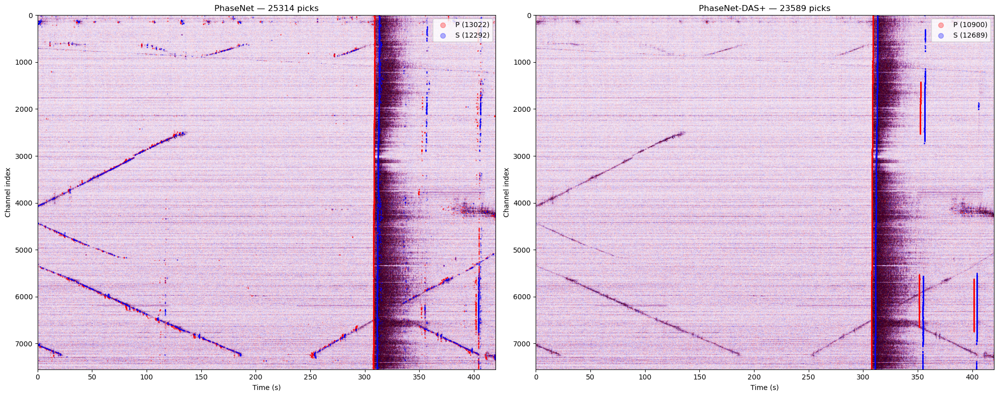

In [14]:
# Side-by-side comparison
fig, axes = plt.subplots(1, 2, figsize=(20, 8))

for ax, df, title in zip(axes, [df_pn, df_das], ["PhaseNet", "PhaseNet-DAS+"]):
    plot_das(ax, data, nx, nt, dt_s, cmap="seismic", vmin=-vmax, vmax=vmax)
    plot_picks(ax, df, dt_s)
    ax.set_xlabel("Time (s)")
    ax.set_ylabel("Channel index")
    ax.set_title(f"{title} — {len(df)} picks")
    ax.legend(loc="upper right", markerscale=10)

plt.tight_layout()
plt.show()

## 4. Compare at Scale

We have pre-computed picks for all 2,470 Arcata events using both models. Let's compare on specific examples.

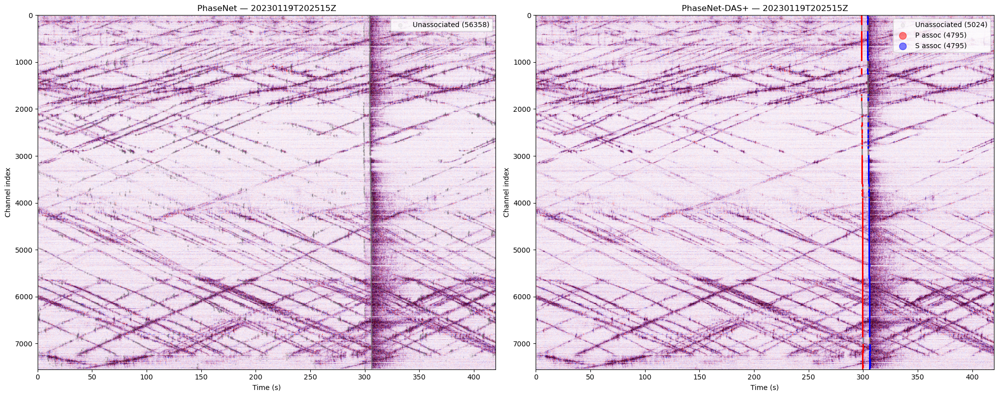

In [15]:
# Visualize a weak event: PhaseNet fails, PhaseNet-DAS+ succeeds
WEAK_EVENT = "20230119T202515Z"

h5_path = hf_hub_download(
    HF_REPO, f"arcata/data/{WEAK_EVENT}.h5", repo_type="dataset",
    local_dir="data/quakeflow_das",
)
with h5py.File(h5_path, "r") as fp:
    weak_data = fp["data"][:]

pn_path = hf_hub_download(
    HF_REPO, f"arcata/phasenet/picks/{WEAK_EVENT}.parquet",
    repo_type="dataset", local_dir="data/quakeflow_das",
)
das_path = hf_hub_download(
    HF_REPO, f"arcata/phasenet_das/picks/{WEAK_EVENT}.parquet",
    repo_type="dataset", local_dir="data/quakeflow_das",
)

pn_weak = pd.read_parquet(pn_path)
das_weak = pd.read_parquet(das_path)

fig, axes = plt.subplots(1, 2, figsize=(20, 8))
vmax_w = 2 * np.percentile(np.abs(weak_data), 95)
nx_w, nt_w = weak_data.shape

for ax, df, title in zip(axes, [pn_weak, das_weak], ["PhaseNet", "PhaseNet-DAS+"]):
    plot_das(ax, weak_data, nx_w, nt_w, dt_s, cmap="seismic", vmin=-vmax_w, vmax=vmax_w)

    assoc = df[df["origin_id"] >= 0]
    unassoc = df[df["origin_id"] < 0]

    if len(unassoc) > 0:
        ax.scatter(unassoc["phase_index"] * dt_s, unassoc["channel_index"].astype(int),
                   s=0.3, c="gray", alpha=0.1, label=f"Unassociated ({len(unassoc)})")
    if len(assoc) > 0:
        for phase, color in [("P", "red"), ("S", "blue")]:
            a = assoc[assoc["phase_type"] == phase]
            ax.scatter(a["phase_index"] * dt_s, a["channel_index"].astype(int),
                       s=1, c=color, alpha=0.5, label=f"{phase} assoc ({len(a)})")

    ax.set_xlabel("Time (s)")
    ax.set_ylabel("Channel index")
    ax.set_title(f"{title} — {WEAK_EVENT}")
    ax.legend(loc="upper right", markerscale=10)

plt.tight_layout()
plt.show()

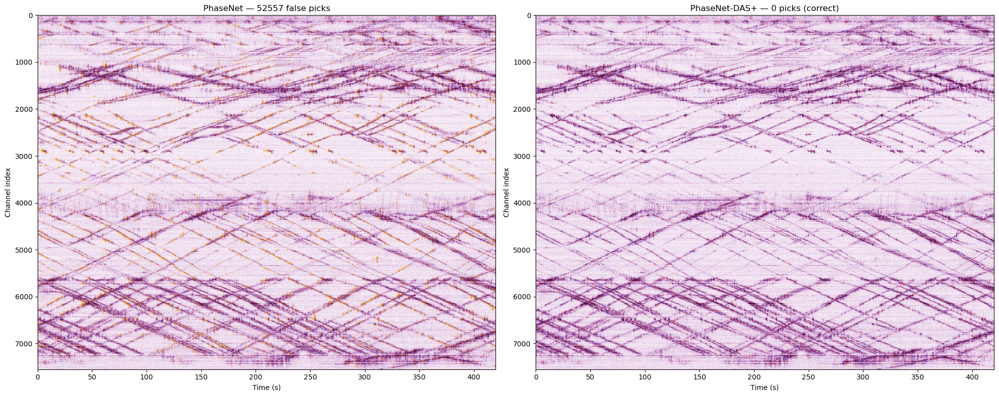

In [16]:
# Noise-only event: PhaseNet hallucinates picks, DAS+ correctly rejects
NOISE_EVENT = "20230103T220320Z"

h5_path = hf_hub_download(
    HF_REPO, f"arcata/data/{NOISE_EVENT}.h5", repo_type="dataset",
    local_dir="data/quakeflow_das",
)
with h5py.File(h5_path, "r") as fp:
    noise_data = fp["data"][:]

pn_noise = pd.read_parquet(hf_hub_download(
    HF_REPO, f"arcata/phasenet/picks/{NOISE_EVENT}.parquet",
    repo_type="dataset", local_dir="data/quakeflow_das",
))

fig, axes = plt.subplots(1, 2, figsize=(20, 8))
vmax_n = 2 * np.percentile(np.abs(noise_data), 95)
nx_n, nt_n = noise_data.shape

ax = axes[0]
plot_das(ax, noise_data, nx_n, nt_n, dt_s, cmap="seismic", vmin=-vmax_n, vmax=vmax_n)
ax.scatter(pn_noise["phase_index"] * dt_s, pn_noise["channel_index"].astype(int),
           s=0.3, c="orange", alpha=0.1)
ax.set_title(f"PhaseNet — {len(pn_noise)} false picks")
ax.set_xlabel("Time (s)")
ax.set_ylabel("Channel index")

ax = axes[1]
plot_das(ax, noise_data, nx_n, nt_n, dt_s, cmap="seismic", vmin=-vmax_n, vmax=vmax_n)
ax.set_title("PhaseNet-DAS+ — 0 picks (correct)")
ax.set_xlabel("Time (s)")
ax.set_ylabel("Channel index")

plt.tight_layout()
plt.show()

## Summary

| | PhaseNet (seismic) | PhaseNet-DAS+ |
|---|---|---|
| **Input** | 3-component (zero-padded DAS) | Native 1-component DAS |
| **Architecture** | Independent per-channel 1D | Spatiotemporal 2D convolutions |
| **Strong events** | Detects P/S arrivals | Detects P/S + event heads |
| **Weak events** | Misses most arrivals | Detects using spatial coherence |
| **Noise** | Many false picks | Correctly rejects noise |

Browse all 2,467 prediction figures: [Google Drive](https://drive.google.com/drive/folders/1natqPKvg0q07AxLWFOSEpTEcE1OTzt2h?usp=sharing)

**Next:** [Lab 2b](lab2b_pick_association.ipynb) explores how raw picks are grouped into seismic events using P-S pairing and origin time estimation.